# environment

In [1]:
using Pkg, Plots
rpfolder="../"
Pkg.activate(rpfolder)

  Activating environment at `~/Codes/RidePoolingSimulations/simulation_code/Project.toml`


In [ ]:
Pkg.instantiate()

In [2]:
include(rpfolder*"src/RidePooling.jl")
RP=RidePooling

Main.RidePooling

# stargrids

## stargrid_32_32

#### initiate

In [3]:
include("../maps/stargrid_32_32/map.jl")

1.0

In [4]:
x=6

N=3;

In [5]:
max_waiting_time=t0
max_relative_detour=1.0

model=RP.get_model(
    ν=x/t0,
    N_bus=N,
    map=map,
    route_matrix=RM,
    subspaces=:all_edges,
    routing=:lookup,
    speed_dict=speed_dict,

    cost=:trajectory_length,
    rejection_criterion=((:any_waiting_time,max_waiting_time),(:any_relative_detour,max_relative_detour)),

    seed=3,
    );

In [48]:
RP.run!(model,time=5.0*t0)

#### map image

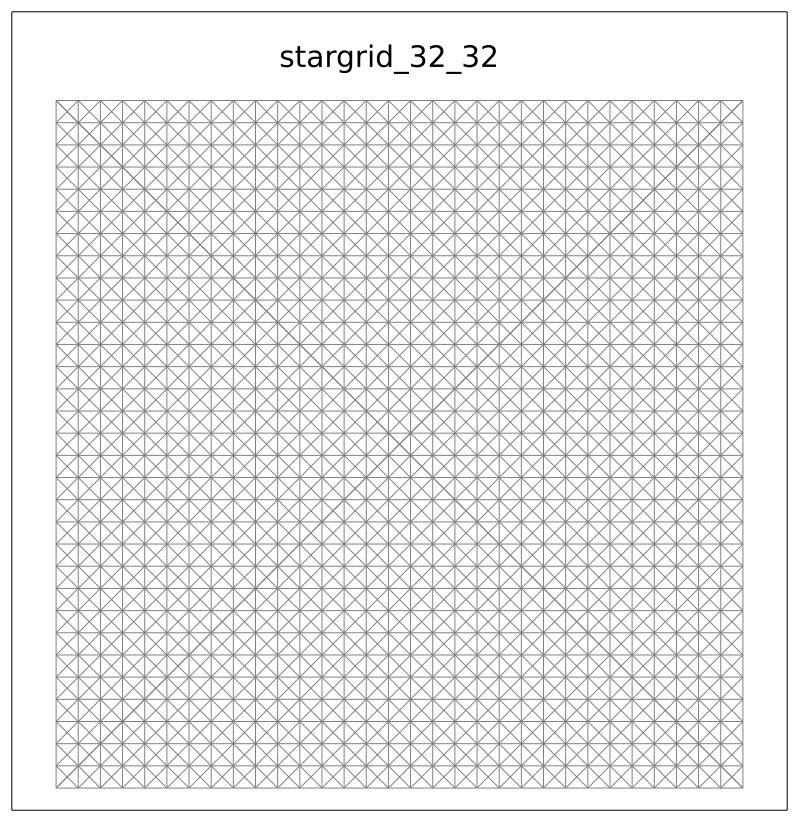

In [7]:
xmax=32
ymax=32
leftrightpad=2
toppad=4

aspect_ratio=(ymax+toppad)/(xmax-1+2*leftrightpad)
background=plot(xlim=(1-leftrightpad,xmax+leftrightpad),ylim=(0,ymax+toppad),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

for y in 1:ymax
    plot!([1,xmax], [y,y], color =:grey)
end

for x in 1:xmax
    #vertical
    plot!([x,x],[1,ymax], color =:grey)

    #from x-axis to the left
    xleft= max(1,x-(ymax-1))
    yleft= 1+(x-xleft)
    plot!([x,xleft],[1,yleft], color =:grey)
    plot!([x,xleft],[ymax,ymax-yleft+1], color =:grey)

    #from x-axis to the right
    xright= min(xmax,x+ymax-1)
    yright= 1+(xright-x)
    plot!([x,xright],[1,yright], color =:grey)
    plot!([x,xright],[ymax,ymax-yright+1], color =:grey)
end

POS=[16,34];FS=20
pos=POS
annotate!(pos[1],pos[2],("stargrid_32_32",:black,FS))

#### background

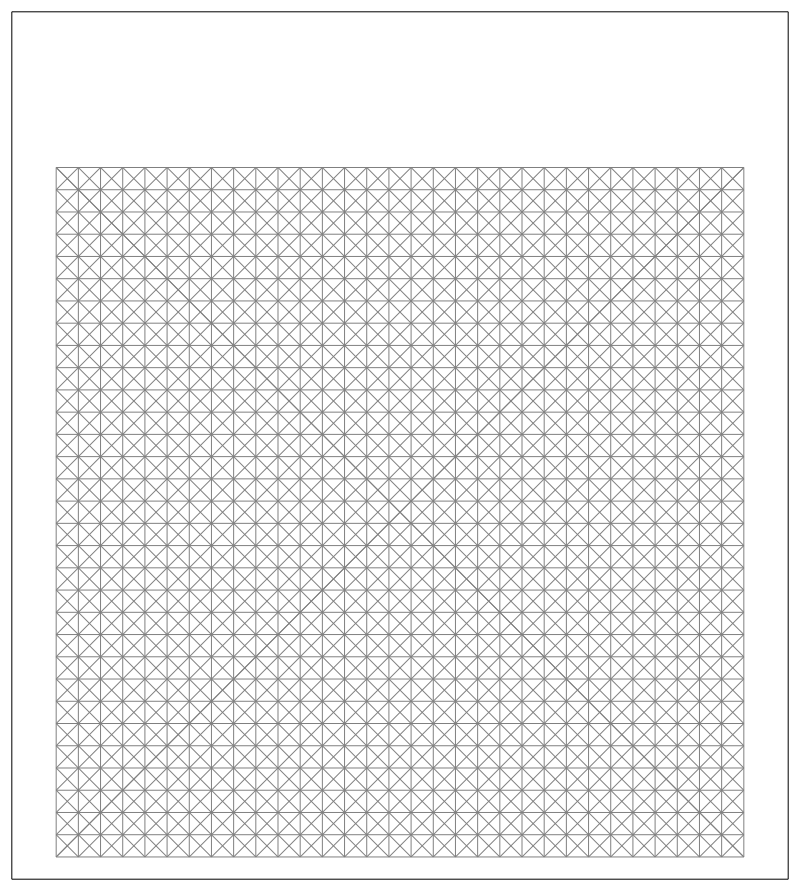

In [321]:
xmax=32
ymax=32
leftrightpad=2
toppad=7

aspect_ratio=(ymax+toppad)/(xmax-1+2*leftrightpad)
background=plot(xlim=(1-leftrightpad,xmax+leftrightpad),ylim=(0,ymax+toppad),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

for y in 1:ymax
    plot!([1,xmax], [y,y], color =:grey)
end

for x in 1:xmax
    #vertical
    plot!([x,x],[1,ymax], color =:grey)

    #from x-axis to the left
    xleft= max(1,x-(ymax-1))
    yleft= 1+(x-xleft)
    plot!([x,xleft],[1,yleft], color =:grey)
    plot!([x,xleft],[ymax,ymax-yleft+1], color =:grey)

    #from x-axis to the right
    xright= min(xmax,x+ymax-1)
    yright= 1+(xright-x)
    plot!([x,xright],[1,yright], color =:grey)
    plot!([x,xright],[ymax,ymax-yright+1], color =:grey)
end

POS=[14,31.5];FS=14
pos=POS+[-12.0,4.0]
scatter!([pos[1]],[pos[2]],color=:black,marker=:star5,markersize=9)
annotate!(pos[1]+2.2,pos[2],(": pickup",:black,FS))

pos=POS+[-12.0,2.5]
scatter!([pos[1]],[pos[2]],color=:black,marker=:utriangle,markersize=9)
annotate!(pos[1]+2.4,pos[2],(": dropoff",:black,FS))

background

In [335]:
savefig("../figures_gifs/stargrid_32_32.pdf")

#### gif

In [ ]:
num_frames=2000
model.time_step=t0/10000

frames= @animate for k in 1:1:num_frames
    RP.step!(model, RP.dummystep, RP.model_step!, 40)
    
    p=plot(deepcopy(background))
    RP.plot_model!(model,p)
    title!("time = $(round(model.time/(t0/2);digits=1)) t₀")
    
    #bus numbers
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,11)))
    end
    
    POS=[14,37.5];vspace=[0,2];hspace1=[2.5,0];hspace2=[1.5,0];FS=14
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,9)))
        annotate!((POS[1],POS[2],("bus $k: ",:black,FS)))
        for (index,job) in enumerate(model[k].todo)
            id=job.req_id
            kind=job.Δ
            color=model.requests[id].plotcolor
            pos=POS+hspace1+(index-1)*hspace2
            scatter!([pos[1]],[pos[2]],color=color,marker=(kind==1 ? :star5 : :utriangle),markersize=9)
        end
        POS-=vspace
    end
    p

end;

┌ Info: Saved animation to 
│   fn = /home/smuehle/Codes/RidePoolingUser/figures_gifs/stargrid32_32_seed3_x6.gif
└ @ Plots /home/smuehle/.julia/packages/Plots/SjqWU/src/animation.jl:104


Plots.AnimatedGif("/home/smuehle/Codes/RidePoolingUser/figures_gifs/stargrid32_32_seed3_x6.gif")
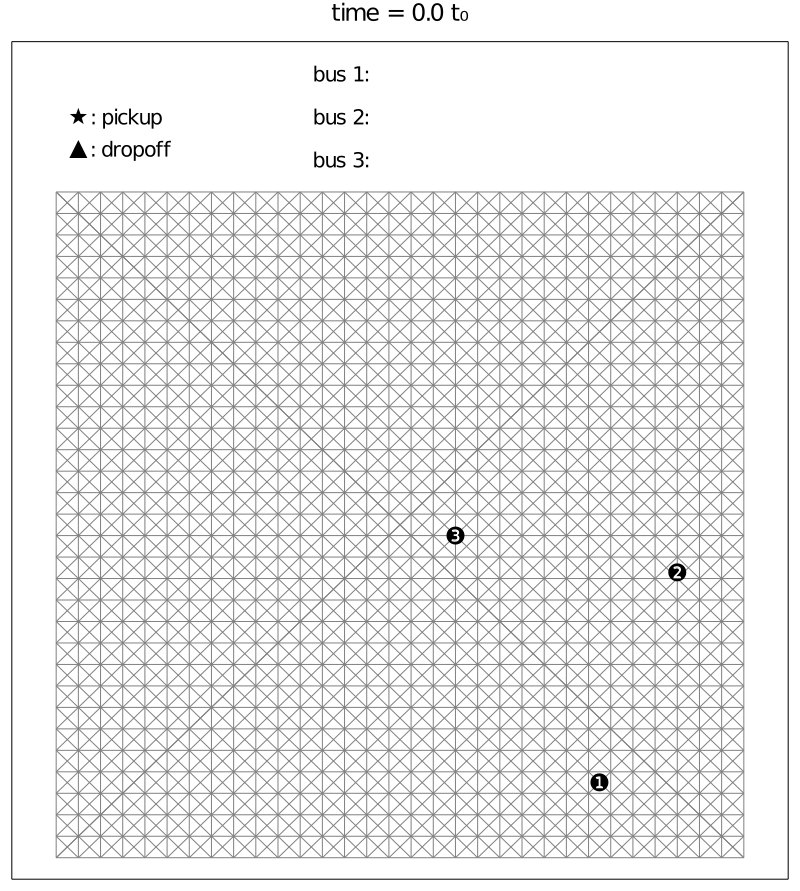

In [ ]:
mygif=gif(frames, "../figures_gifs/stargrid32_32_seed3_x6.gif", fps = 40)

## stargrid_64_16

#### initiate

In [336]:
include("../maps/stargrid_64_16/map.jl")

45.339190347724944

In [337]:
x=6

N=3;

In [338]:
max_waiting_time=t0
max_relative_detour=1.0

model=RP.get_model(
    ν=x/t0,
    N_bus=N,
    map=map,
    route_matrix=RM,
    subspaces=:all_edges,
    routing=:lookup,
    speed_dict=speed_dict,

    cost=:trajectory_length,
    rejection_criterion=((:any_waiting_time,max_waiting_time),(:any_relative_detour,max_relative_detour)),

    seed=3,
    );

In [ ]:
RP.run!(model,time=5.0*t0)

#### map image

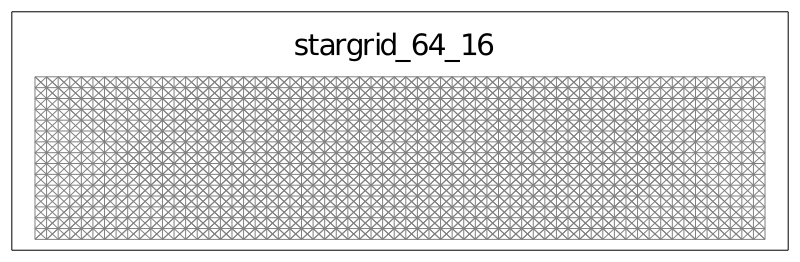

In [343]:
xmax=64
ymax=16
leftrightpad=2
toppad=6

aspect_ratio=(ymax+toppad)/(xmax-1+2*leftrightpad)
background=plot(xlim=(1-leftrightpad,xmax+leftrightpad),ylim=(0,ymax+toppad),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

for y in 1:ymax
    plot!([1,xmax], [y,y], color =:grey)
end

for x in 1:xmax
    #vertical
    plot!([x,x],[1,ymax], color =:grey)

    #from x-axis to the left
    xleft= max(1,x-(ymax-1))
    yleft= 1+(x-xleft)
    plot!([x,xleft],[1,yleft], color =:grey)
    plot!([x,xleft],[ymax,ymax-yleft+1], color =:grey)

    #from x-axis to the right
    xright= min(xmax,x+ymax-1)
    yright= 1+(xright-x)
    plot!([x,xright],[1,yright], color =:grey)
    plot!([x,xright],[ymax,ymax-yright+1], color =:grey)
end

POS=[32,19];FS=20
pos=POS
annotate!(pos[1],pos[2],("stargrid_64_16",:black,FS))

background

In [344]:
savefig("../figures_gifs/stargrid_64_16.pdf")

#### background

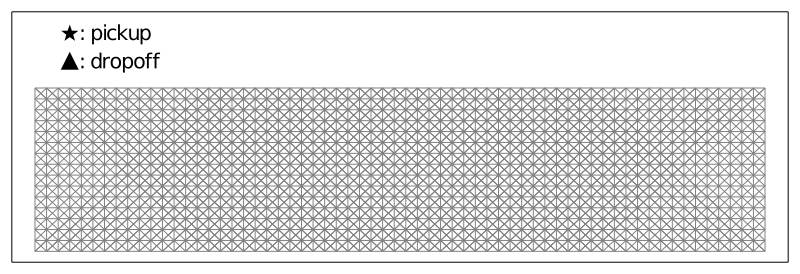

In [84]:
xmax=64
ymax=16
leftrightpad=2
toppad=7

aspect_ratio=(ymax+toppad)/(xmax-1+2*leftrightpad)
background=plot(xlim=(1-leftrightpad,xmax+leftrightpad),ylim=(0,ymax+toppad),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

for y in 1:ymax
    plot!([1,xmax], [y,y], color =:grey)
end

for x in 1:xmax
    #vertical
    plot!([x,x],[1,ymax], color =:grey)

    #from x-axis to the left
    xleft= max(1,x-(ymax-1))
    yleft= 1+(x-xleft)
    plot!([x,xleft],[1,yleft], color =:grey)
    plot!([x,xleft],[ymax,ymax-yleft+1], color =:grey)

    #from x-axis to the right
    xright= min(xmax,x+ymax-1)
    yright= 1+(xright-x)
    plot!([x,xright],[1,yright], color =:grey)
    plot!([x,xright],[ymax,ymax-yright+1], color =:grey)
end

POS=[4,21];FS=14
pos=POS
scatter!([pos[1]],[pos[2]],color=:black,marker=:star5,markersize=9)
annotate!(pos[1]+4,pos[2]+0.1,(": pickup",:black,FS))

pos=POS+[0.0,-2.5]
scatter!([pos[1]],[pos[2]],color=:black,marker=:utriangle,markersize=9)
annotate!(pos[1]+4.4,pos[2],(": dropoff",:black,FS))

background

#### gif

In [100]:
num_frames=2000
model.time_step=t0/10000

frames= @animate for k in 1:1:num_frames
    RP.step!(model, RP.dummystep, RP.model_step!, 40)
    
    p=plot(deepcopy(background))
    RP.plot_model!(model,p;flip=true)
    title!("time = $(round(model.time/(t0/2);digits=1)) t₀")
    
    #bus numbers
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model;flip=true)
        annotate!((point[1],point[2],("$k",:white,11)))
    end
    
    POS=[30,21.5];vspace=[0,2];hspace1=[5,0];hspace2=[2,0];FS=14
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model;flip=true)
        annotate!((point[1],point[2],("$k",:white,9)))
        annotate!((POS[1],POS[2],("bus $k: ",:black,FS)))
        for (index,job) in enumerate(model[k].todo)
            id=job.req_id
            kind=job.Δ
            color=model.requests[id].plotcolor
            pos=POS+hspace1+(index-1)*hspace2
            scatter!([pos[1]],[pos[2]],color=color,marker=(kind==1 ? :star5 : :utriangle),markersize=9)
        end
        POS-=vspace
    end
    p

end;

┌ Info: Saved animation to 
│   fn = /home/smuehle/Codes/RidePoolingUser/figures_gifs/stargrid64_16_seed3_x6.gif
└ @ Plots /home/smuehle/.julia/packages/Plots/SjqWU/src/animation.jl:104


Plots.AnimatedGif("/home/smuehle/Codes/RidePoolingUser/figures_gifs/stargrid64_16_seed3_x6.gif")
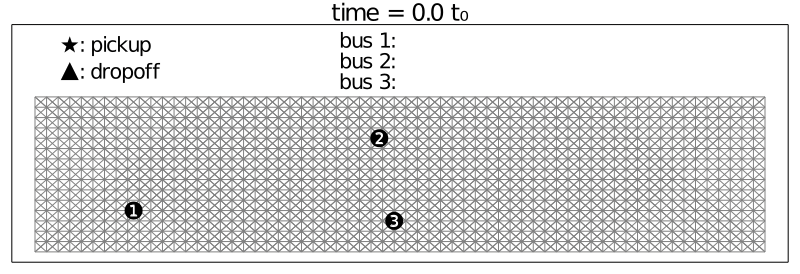

In [101]:
mygif=gif(frames, "../figures_gifs/stargrid64_16_seed3_x6.gif", fps = 40)

## stargrid_128_8

#### initiate

In [345]:
include("../maps/stargrid_128_8/map.jl")

86.9623813106492

In [346]:
x=6

N=3;

In [347]:
max_waiting_time=t0
max_relative_detour=1.0

model=RP.get_model(
    ν=x/t0,
    N_bus=N,
    map=map,
    route_matrix=RM,
    subspaces=:all_edges,
    routing=:lookup,
    speed_dict=speed_dict,

    cost=:trajectory_length,
    rejection_criterion=((:any_waiting_time,max_waiting_time),(:any_relative_detour,max_relative_detour)),

    seed=3,
    );

In [ ]:
RP.run!(model,time=5.0*t0)

#### map image

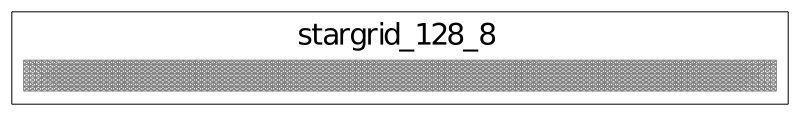

In [352]:
xmax=128
ymax=8
leftrightpad=2
toppad=11

aspect_ratio=(ymax+toppad)/(xmax-1+2*leftrightpad)
background=plot(xlim=(1-leftrightpad,xmax+leftrightpad),ylim=(-2,ymax+toppad),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

for y in 1:ymax
    plot!([1,xmax], [y,y], color =:grey)
end

for x in 1:xmax
    #vertical
    plot!([x,x],[1,ymax], color =:grey)

    #from x-axis to the left
    xleft= max(1,x-(ymax-1))
    yleft= 1+(x-xleft)
    plot!([x,xleft],[1,yleft], color =:grey)
    plot!([x,xleft],[ymax,ymax-yleft+1], color =:grey)

    #from x-axis to the right
    xright= min(xmax,x+ymax-1)
    yright= 1+(xright-x)
    plot!([x,xright],[1,yright], color =:grey)
    plot!([x,xright],[ymax,ymax-yright+1], color =:grey)
end

POS=[64,14];FS=20
pos=POS
annotate!(pos[1],pos[2],("stargrid_128_8",:black,FS))

background

In [353]:
savefig("../figures_gifs/stargrid_128_8.pdf")

#### background

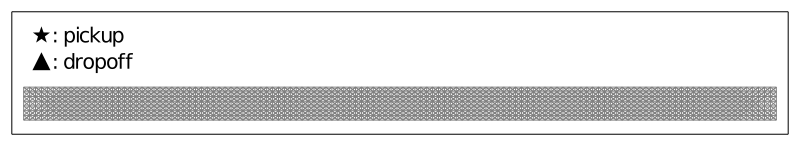

In [127]:
xmax=128
ymax=8
leftrightpad=2
toppad=16

aspect_ratio=(ymax+toppad)/(xmax-1+2*leftrightpad)
background=plot(xlim=(1-leftrightpad,xmax+leftrightpad),ylim=(-2,ymax+toppad),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

for y in 1:ymax
    plot!([1,xmax], [y,y], color =:grey)
end

for x in 1:xmax
    #vertical
    plot!([x,x],[1,ymax], color =:grey)

    #from x-axis to the left
    xleft= max(1,x-(ymax-1))
    yleft= 1+(x-xleft)
    plot!([x,xleft],[1,yleft], color =:grey)
    plot!([x,xleft],[ymax,ymax-yleft+1], color =:grey)

    #from x-axis to the right
    xright= min(xmax,x+ymax-1)
    yright= 1+(xright-x)
    plot!([x,xright],[1,yright], color =:grey)
    plot!([x,xright],[ymax,ymax-yright+1], color =:grey)
end

POS=[4,19];FS=14
pos=POS
scatter!([pos[1]],[pos[2]],color=:black,marker=:star5,markersize=9)
annotate!(pos[1]+8,pos[2]+0.1,(": pickup",:black,FS))

pos=POS+[0.0,-5.5]
scatter!([pos[1]],[pos[2]],color=:black,marker=:utriangle,markersize=9)
annotate!(pos[1]+8.8,pos[2],(": dropoff",:black,FS))

background

#### gif

In [152]:
num_frames=2000
model.time_step=t0/10000

frames= @animate for k in 1:1:num_frames
    RP.step!(model, RP.dummystep, RP.model_step!, 40)
    
    p=plot(deepcopy(background))
    RP.plot_model!(model,p;flip=true)
    title!("time = $(round(model.time/(t0/2);digits=1)) t₀")
    plot!(titlefontsize=14)
    
    #bus numbers
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model;flip=true)
        annotate!((point[1],point[2],("$k",:white,11)))
    end
    
    POS=[50,20.5];vspace=[0,4];hspace1=[7,0];hspace2=[3.6,0];FS=14
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model;flip=true)
        annotate!((point[1],point[2],("$k",:white,9)))
        annotate!((POS[1],POS[2],("bus $k: ",:black,FS)))
        for (index,job) in enumerate(model[k].todo)
            id=job.req_id
            kind=job.Δ
            color=model.requests[id].plotcolor
            pos=POS+hspace1+(index-1)*hspace2
            scatter!([pos[1]],[pos[2]],color=color,marker=(kind==1 ? :star5 : :utriangle),markersize=9)
        end
        POS-=vspace
    end
    p

end;

┌ Info: Saved animation to 
│   fn = /home/smuehle/Codes/RidePoolingUser/figures_gifs/stargrid128_8_seed3_x6.gif
└ @ Plots /home/smuehle/.julia/packages/Plots/SjqWU/src/animation.jl:104


Plots.AnimatedGif("/home/smuehle/Codes/RidePoolingUser/figures_gifs/stargrid128_8_seed3_x6.gif")
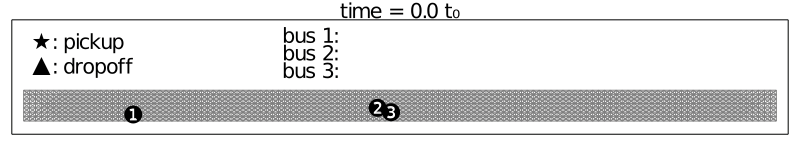

In [153]:
mygif=gif(frames, "../figures_gifs/stargrid128_8_seed3_x6.gif", fps = 40)

# htree4

#### initiate

In [354]:
include("../maps/htree4/map.jl")

22.295737992256377

In [355]:
x=6

N=3;

In [356]:
max_waiting_time=t0
max_relative_detour=1.0

model=RP.get_model(
    ν=x/t0,
    N_bus=N,
    map=map,
    route_matrix=RM,
    subspaces=:all_edges,
    routing=:lookup,
    speed_dict=speed_dict,

    cost=:trajectory_length,
    rejection_criterion=((:any_waiting_time,max_waiting_time),(:any_relative_detour,max_relative_detour)),

    seed=3,
    );

In [ ]:
RP.run!(model,time=5.0*t0)

#### map image

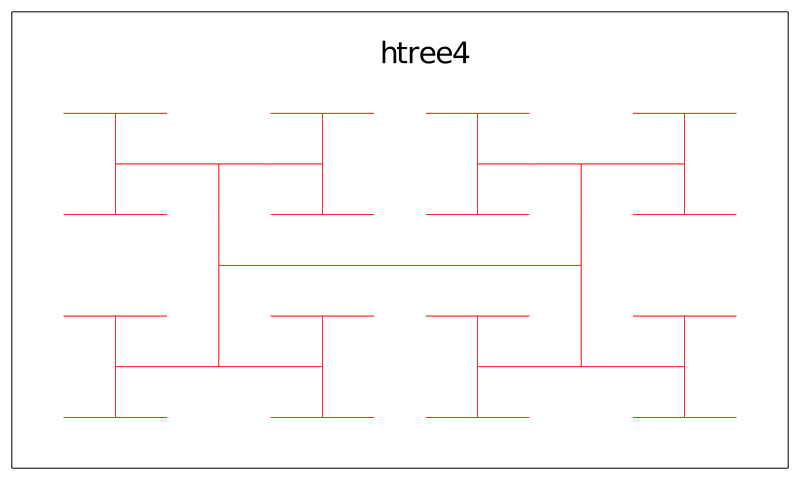

In [372]:
xmin,xmax=-4,11
ymin,ymax=-4,5

aspect_ratio=(ymax-ymin)/(xmax-xmin)
background=plot(xlim=(xmin,xmax),ylim=(ymin,ymax),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)

RP.plot_subspaces!(model,background)

POS=[4,4.2];FS=20
pos=POS
annotate!(pos[1],pos[2],("htree4",:black,FS))

background

In [373]:
savefig("../figures_gifs/htree4.pdf")

#### background

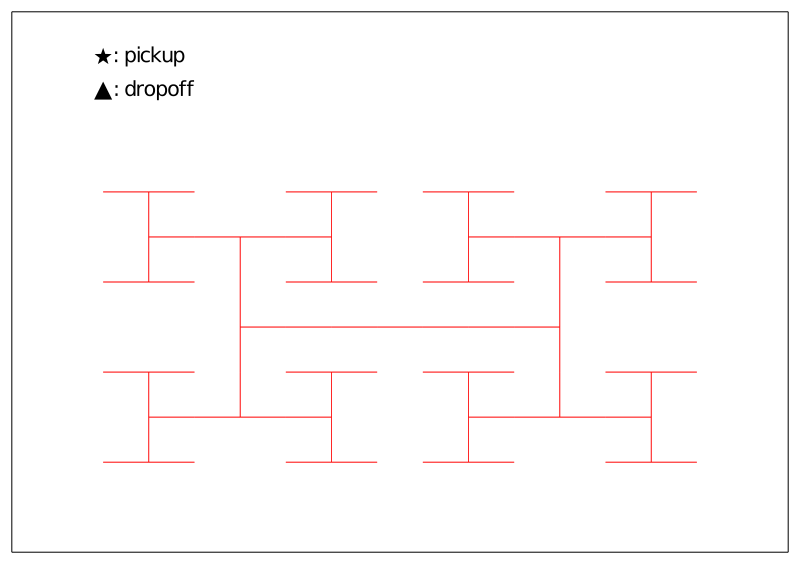

In [213]:
xmin,xmax=-5,12
ymin,ymax=-5,7
leftrightpad=2
toppad=2

aspect_ratio=(ymax-ymin)/(xmax-xmin)
background=plot(xlim=(xmin,xmax),ylim=(ymin,ymax),legend=:none,grid=:none,box=:frame,ticks=:none,size=(800,800*aspect_ratio),titlefontsize=16)


RP.plot_subspaces!(model,background)

POS=[-3,6];FS=14
pos=POS
scatter!([pos[1]],[pos[2]],color=:black,marker=:star5,markersize=9)
annotate!(pos[1]+1.02,pos[2]+0.05,(": pickup",:black,FS))

pos=POS+[0.0,-.75]
scatter!([pos[1]],[pos[2]],color=:black,marker=:utriangle,markersize=9)
annotate!(pos[1]+1.13,pos[2]+0.05,(": dropoff",:black,FS))

background

#### gif

In [217]:
num_frames=2000
model.time_step=t0/10000

frames= @animate for k in 1:1:num_frames
    RP.step!(model, RP.dummystep, RP.model_step!, 40)
    
    p=plot(deepcopy(background))
    RP.plot_model!(model,p)
    title!("time = $(round(model.time/(t0/2);digits=1)) t₀")
    plot!(titlefontsize=16)
    
    #bus numbers
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,11)))
    end
    
    POS=[3,6.1];vspace=[0,1];hspace1=[0.9,0];hspace2=[.5,0];FS=14
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,9)))
        annotate!((POS[1],POS[2],("bus $k: ",:black,FS)))
        for (index,job) in enumerate(model[k].todo)
            id=job.req_id
            kind=job.Δ
            color=model.requests[id].plotcolor
            pos=POS+hspace1+(index-1)*hspace2
            scatter!([pos[1]],[pos[2]],color=color,marker=(kind==1 ? :star5 : :utriangle),markersize=9)
        end
        POS-=vspace
    end
    p

end;

┌ Info: Saved animation to 
│   fn = /home/smuehle/Codes/RidePoolingUser/figures_gifs/htree4_seed3_x6.gif
└ @ Plots /home/smuehle/.julia/packages/Plots/SjqWU/src/animation.jl:104


Plots.AnimatedGif("/home/smuehle/Codes/RidePoolingUser/figures_gifs/htree4_seed3_x6.gif")
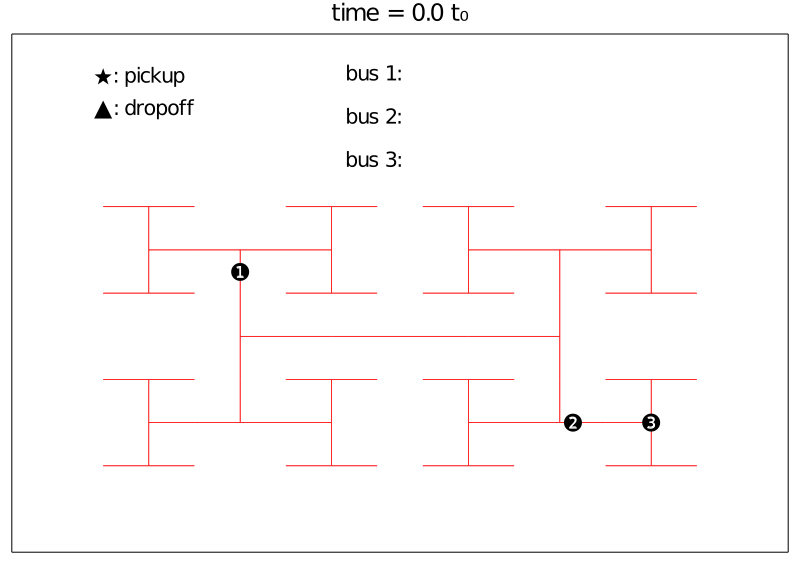

In [218]:
mygif=gif(frames, "../figures_gifs/htree4_seed3_x6.gif", fps = 40)

# OSM

## Broitzem

#### initiate

In [374]:
include("../maps/broitzem/map.jl");

In [221]:
x=6

N=3;

In [375]:
max_waiting_time=t0
max_relative_detour=1.0

model=RP.get_model(
    ν=x/t0,
    N_bus=N,
    map=map,
    route_matrix=RM,
    subspaces=:all_edges,
    routing=:lookup,
    speed_dict=speed_dict,

    cost=:trajectory_length,
    rejection_criterion=((:any_waiting_time,max_waiting_time),(:any_relative_detour,max_relative_detour)),

    seed=3,
    );

In [ ]:
RP.run!(model,time=5.0*t0)

#### map image

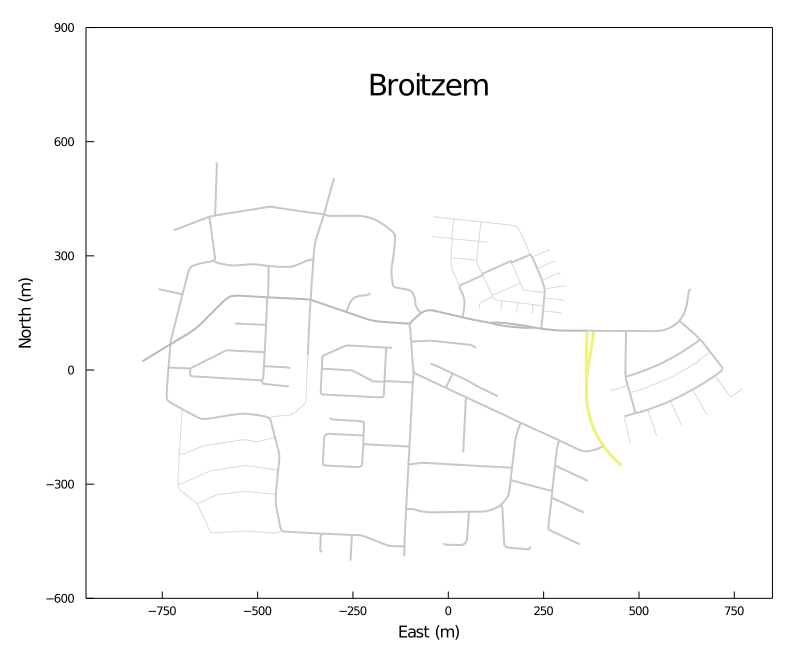

In [379]:
background=RP.plot_background(model)
xmin,xmax=-950,850
ymin,ymax=-600,900
aspect_ratio=(ymax-ymin)/(xmax-xmin)
plot!(grid=:none,xlim=(xmin,xmax),ylim=(ymin,ymax),size=(800,800*aspect_ratio))

POS=[0.5*(xmin+xmax),750];FS=20
pos=POS
annotate!(pos[1],pos[2],("Broitzem",:black,FS))

background

In [380]:
savefig("../figures_gifs/broitzem.pdf")

#### background

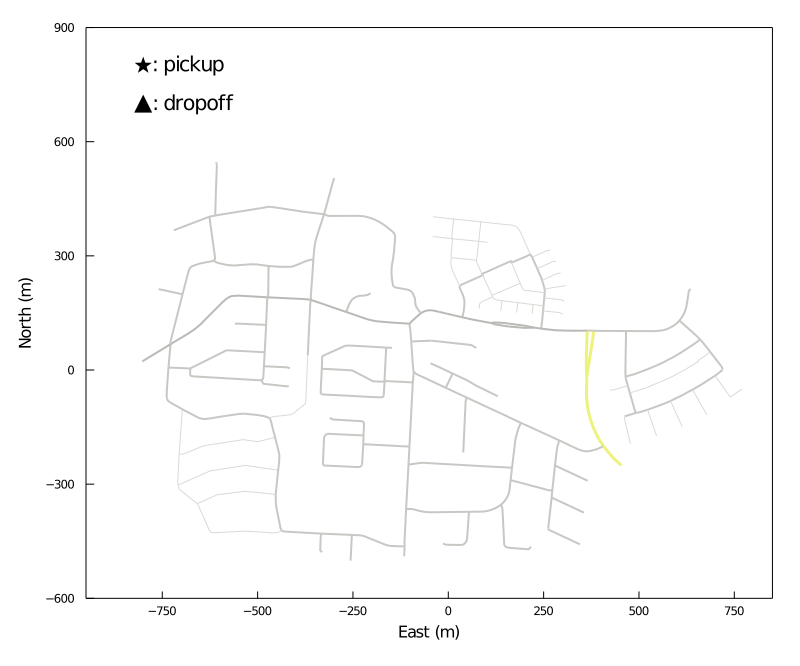

In [264]:
background=RP.plot_background(model)
xmin,xmax=-950,850
ymin,ymax=-600,900
aspect_ratio=(ymax-ymin)/(xmax-xmin)
plot!(grid=:none,xlim=(xmin,xmax),ylim=(ymin,ymax),size=(800,800*aspect_ratio))

POS=[-800,800];FS=14
pos=POS
scatter!([pos[1]],[pos[2]],color=:black,marker=:star5,markersize=9)
annotate!(pos[1]+120,pos[2]+5,(": pickup",:black,FS))

pos=POS+[0.0,-100]
scatter!([pos[1]],[pos[2]],color=:black,marker=:utriangle,markersize=9)
annotate!(pos[1]+133,pos[2]+3,(": dropoff",:black,FS))

#### gif

In [283]:
num_frames=2000
model.time_step=t0/10000

frames= @animate for k in 1:1:num_frames
    RP.step!(model, RP.dummystep, RP.model_step!, 40)
    
    p=plot(deepcopy(background))
    RP.plot_model!(model,p)
    title!("time = $(round(model.time/(t0/2);digits=1)) t₀")
    plot!(titlefontsize=16)
    
    #bus numbers
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,11)))
    end
    
    POS=[0,800];vspace=[0,70];hspace1=[120,0];hspace2=[60,0];FS=14
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,9)))
        annotate!((POS[1],POS[2],("bus $k: ",:black,FS)))
        for (index,job) in enumerate(model[k].todo)
            id=job.req_id
            kind=job.Δ
            color=model.requests[id].plotcolor
            pos=POS+hspace1+(index-1)*hspace2
            scatter!([pos[1]],[pos[2]],color=color,marker=(kind==1 ? :star5 : :utriangle),markersize=9)
        end
        POS-=vspace
    end
    p

end;

┌ Info: Saved animation to 
│   fn = /home/smuehle/Codes/RidePoolingUser/figures_gifs/broitzem_seed3_x6.gif
└ @ Plots /home/smuehle/.julia/packages/Plots/SjqWU/src/animation.jl:104


Plots.AnimatedGif("/home/smuehle/Codes/RidePoolingUser/figures_gifs/broitzem_seed3_x6.gif")
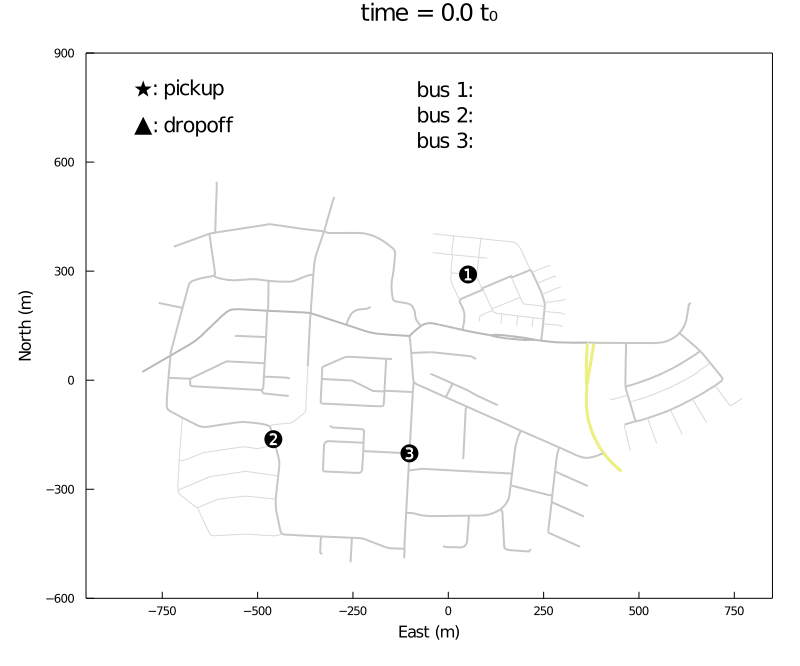

In [284]:
mygif=gif(frames, "../figures_gifs/broitzem_seed3_x6.gif", fps = 40)

## Göttingen

#### initiate

In [381]:
include("../maps/goettingen/map.jl");

In [286]:
x=6

N=3;

In [382]:
max_waiting_time=t0
max_relative_detour=1.0

model=RP.get_model(
    ν=x/t0,
    N_bus=N,
    map=map,
    route_matrix=RM,
    subspaces=:all_edges,
    routing=:lookup,
    speed_dict=speed_dict,

    cost=:trajectory_length,
    rejection_criterion=((:any_waiting_time,max_waiting_time),(:any_relative_detour,max_relative_detour)),

    seed=1,
    );

In [ ]:
RP.run!(model,time=5.0*t0)

#### map image

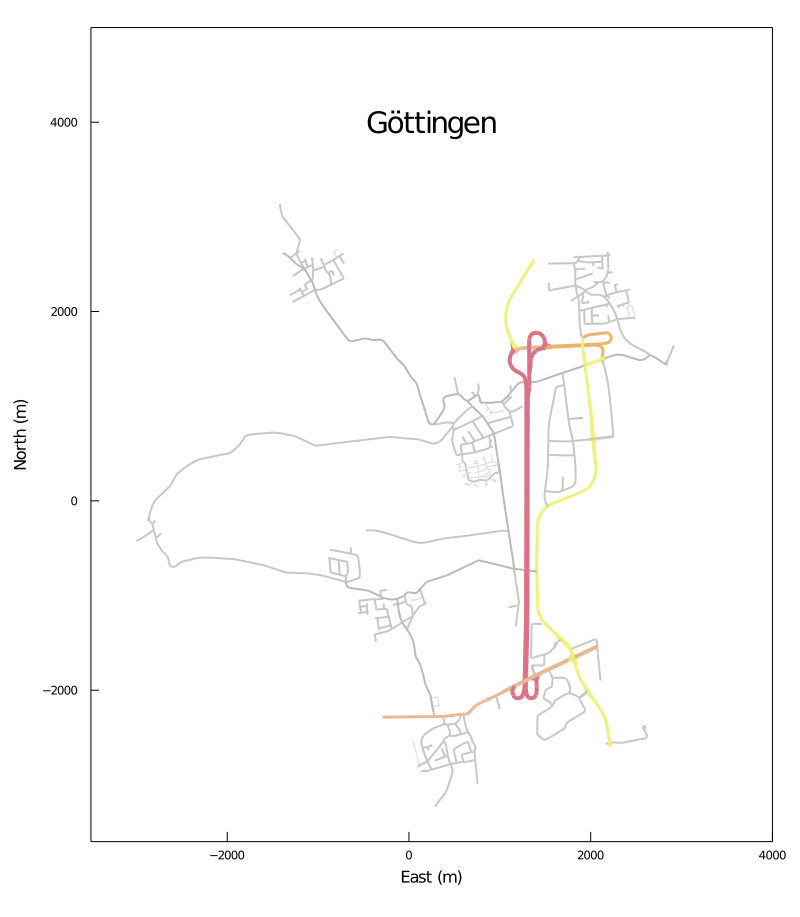

In [384]:
background=RP.plot_background(model)
xmin,xmax=-3500,4000
ymin,ymax=-3600,5000
aspect_ratio=(ymax-ymin)/(xmax-xmin)
plot!(grid=:none,xlim=(xmin,xmax),ylim=(ymin,ymax),size=(800,800*aspect_ratio))

POS=[0.5*(xmin+xmax),4000];FS=20
pos=POS
annotate!(pos[1],pos[2],("Göttingen",:black,FS))

background

In [385]:
savefig("../figures_gifs/goettingen.pdf")

#### background

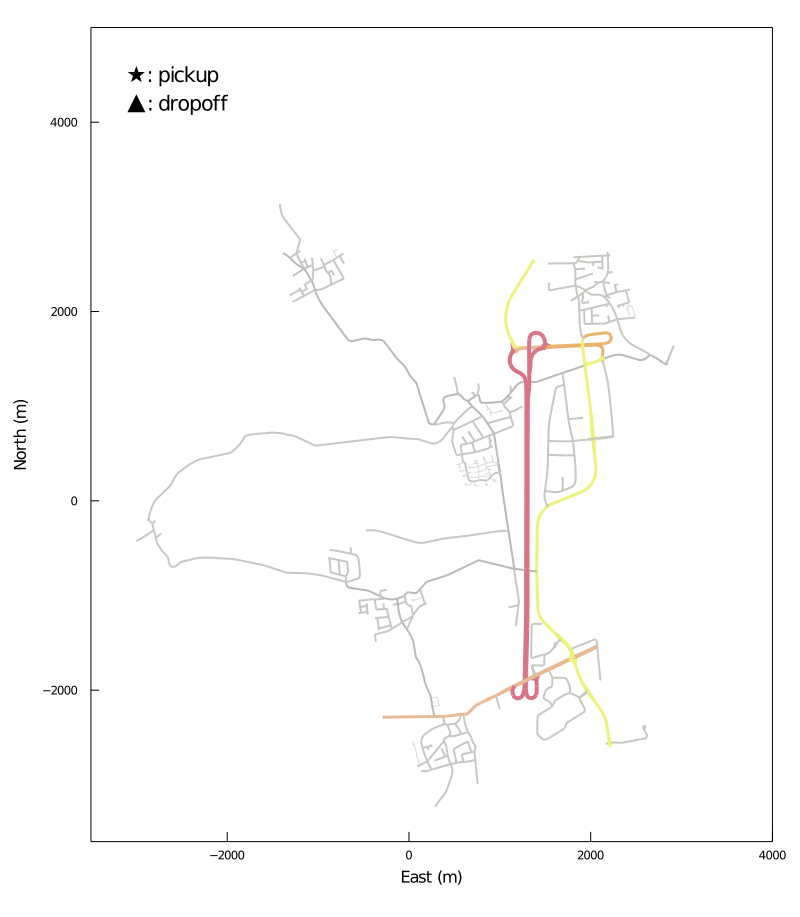

In [303]:
background=RP.plot_background(model)
xmin,xmax=-3500,4000
ymin,ymax=-3600,5000
aspect_ratio=(ymax-ymin)/(xmax-xmin)
plot!(grid=:none,xlim=(xmin,xmax),ylim=(ymin,ymax),size=(800,800*aspect_ratio))

POS=[-3000,4500];FS=14
pos=POS
scatter!([pos[1]],[pos[2]],color=:black,marker=:star5,markersize=9)
annotate!(pos[1]+520,pos[2]+5,(": pickup",:black,FS))

pos=POS+[0.0,-300]
scatter!([pos[1]],[pos[2]],color=:black,marker=:utriangle,markersize=9)
annotate!(pos[1]+575,pos[2]+3,(": dropoff",:black,FS))

#### gif

In [316]:
num_frames=2000
model.time_step=t0/10000

frames= @animate for k in 1:1:num_frames
    RP.step!(model, RP.dummystep, RP.model_step!, 40)
    
    p=plot(deepcopy(background))
    RP.plot_model!(model,p)
    title!("time = $(round(model.time/(t0/2);digits=1)) t₀")
    plot!(titlefontsize=16)
    
    #bus numbers
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,11)))
    end
    
    POS=[500,4500];vspace=[0,270];hspace1=[450,0];hspace2=[250,0];FS=14
    for k in 1:length(model.agents)
        point=RP.cartesian_coords(model[k].pos,model)
        annotate!((point[1],point[2],("$k",:white,9)))
        annotate!((POS[1],POS[2],("bus $k: ",:black,FS)))
        for (index,job) in enumerate(model[k].todo)
            id=job.req_id
            kind=job.Δ
            color=model.requests[id].plotcolor
            pos=POS+hspace1+(index-1)*hspace2
            scatter!([pos[1]],[pos[2]],color=color,marker=(kind==1 ? :star5 : :utriangle),markersize=9)
        end
        POS-=vspace
    end
    p

end;

┌ Info: Saved animation to 
│   fn = /home/smuehle/Codes/RidePoolingUser/figures_gifs/goettingen_seed1_x6.gif
└ @ Plots /home/smuehle/.julia/packages/Plots/SjqWU/src/animation.jl:104


Plots.AnimatedGif("/home/smuehle/Codes/RidePoolingUser/figures_gifs/goettingen_seed1_x6.gif")
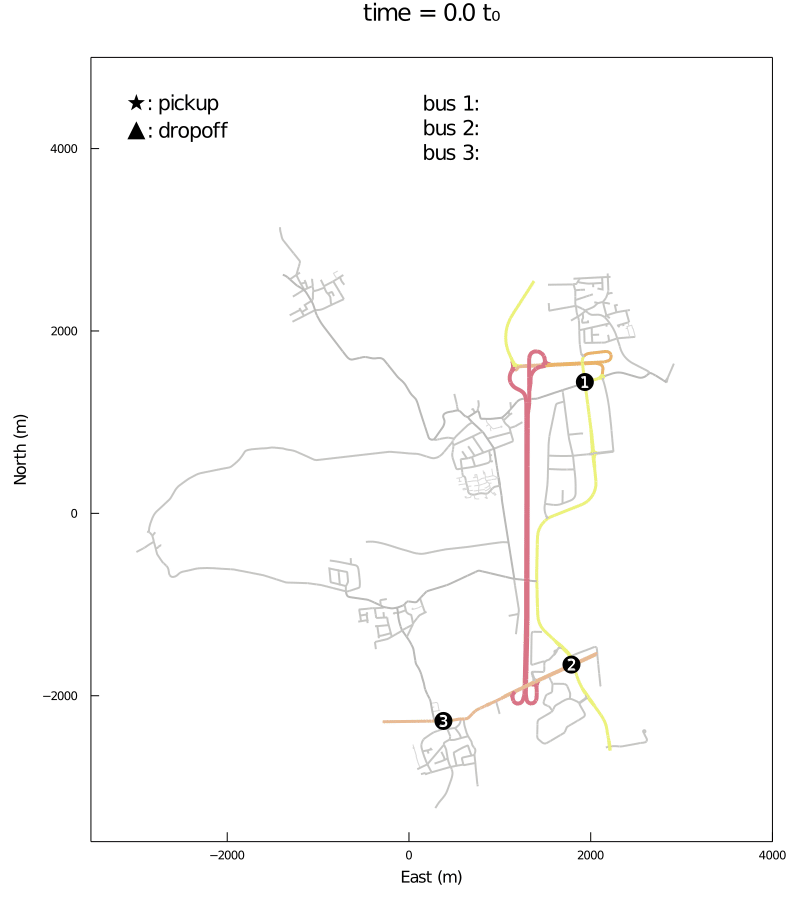

In [317]:
mygif=gif(frames, "../figures_gifs/goettingen_seed1_x6.gif", fps = 40)